In [1]:
# faceMask hDDM face ratings analysis script: mask analyses of false negatives (failing to ID correct emotion)
# 12/07/20

# note: to be run within python 3.5 environment named "hddm" (from console: 'source activate hddm')
# confirm jupyter notebook is launching from "hddm" environment (see top-right: 'conda env:hddm')

# set up
import numpy as np
print(np.__version__) # should be 1.11.3

import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

from patsy import dmatrix

import hddm
print(hddm.__version__) # should be 0.6.0

1.11.3
0.6.0


C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\IPython\parallel.py:13: ShimWarning: The `IPython.parallel` package has been deprecated since IPython 4.0. You should import from ipyparallel instead.
  "You should import from ipyparallel instead.", ShimWarning)


In [2]:
# load hDDM-processed data from CSV file into a NumPy structured array
data = hddm.load_csv('faceMask_hddm_proc.csv')
                     
# flip 'no' response RTs to be negative
data = hddm.utils.flip_errors(data)

# check dataset
data.head(10)

,subj_idx,block,faceList,emotionRating,trial,stimulus,face,model,sex,expression,mask,response,rt,faceAngry,faceDisgusted,faceFearful,faceHappy,faceSad,faceSurprised
0,gc2le9xecjp1stz,0,3,angry,0,_faces/22_F_R_U.jpg,22_F_R_U,22,F,surprised,upper,0,-4.636150,0,0,0,0,0,50
1,gc2le9xecjp1stz,0,3,angry,1,_faces/07_M_H_L.jpg,07_M_H_L,7,M,happy,lower,0,-2.079460,0,0,0,50,0,0
2,gc2le9xecjp1stz,0,3,angry,2,_faces/46_M_R_X.jpg,46_M_R_X,46,M,surprised,baseline,0,-1.847670,0,0,0,0,0,100
3,gc2le9xecjp1stz,0,3,angry,3,_faces/47_M_S_L.jpg,47_M_S_L,47,M,sad,lower,0,-6.506275,0,0,0,0,50,0
4,gc2le9xecjp1stz,0,3,angry,4,_faces/25_M_R_X.jpg,25_M_R_X,25,M,surprised,baseline,0,-1.536780,0,0,0,0,0,100
5,gc2le9xecjp1stz,0,3,angry,5,_faces/27_F_A_U.jpg,27_F_A_U,27,F,angry,upper,1,1.906175,50,0,0,0,0,0
6,gc2le9xecjp1stz,0,3,angry,6,_faces/08_F_S_U.jpg,08_F_S_U,8,F,sad,upper,0,-2.182530,0,0,0,0,50,0
7,gc2le9xecjp1stz,0,3,angry,7,_faces/38_M_H_X.jpg,38_M_H_X,38,M,happy,baseline,0,-1.445230,0,0,0,100,0,0
8,gc2le9xecjp1stz,0,3,angry,8,_faces/30_M_A_U.jpg,30_M_A_U,30,M,angry,upper,1,1.405270,50,0,0,0,0,0
9,gc2le9xecjp1stz,0,3,angry,9,_faces/04_F_R_U.jpg,04_F_R_U,4,F,surprised,upper,0,-1.945385,0,0,0,0,0,50


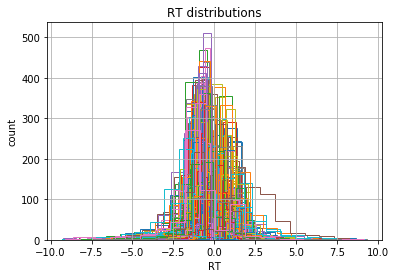

In [3]:
# plot RTs for each participant
fig = plt.figure()
ax = fig.add_subplot(111, xlabel='RT', ylabel='count', title='RT distributions')
for i, subj_data in data.groupby('subj_idx'):
    subj_data.rt.hist(bins=20, histtype='step', ax=ax)

In [4]:
# subset dataset by emotion rating type (surprised) and facial expression (angry)
fa_data = data.loc[(data['emotionRating'] == 'fearful') & (data['expression'] == 'angry')]
fa_data.head(10)

,subj_idx,block,faceList,emotionRating,trial,stimulus,face,model,sex,expression,mask,response,rt,faceAngry,faceDisgusted,faceFearful,faceHappy,faceSad,faceSurprised
106,gc2le9xecjp1stz,1,4,fearful,109,_faces/47_M_A_X.jpg,47_M_A_X,47,M,angry,baseline,0,-1.755375,100,0,0,0,0,0
109,gc2le9xecjp1stz,1,4,fearful,112,_faces/47_M_A_U.jpg,47_M_A_U,47,M,angry,upper,0,-0.885420,50,0,0,0,0,0
114,gc2le9xecjp1stz,1,4,fearful,117,_faces/10_M_A_U.jpg,10_M_A_U,10,M,angry,upper,0,-1.069240,50,0,0,0,0,0
123,gc2le9xecjp1stz,1,4,fearful,126,_faces/26_F_A_L.jpg,26_F_A_L,26,F,angry,lower,0,-0.852435,50,0,0,0,0,0
138,gc2le9xecjp1stz,1,4,fearful,141,_faces/08_F_A_X.jpg,08_F_A_X,8,F,angry,baseline,0,-0.837550,100,0,0,0,0,0
140,gc2le9xecjp1stz,1,4,fearful,143,_faces/26_F_A_X.jpg,26_F_A_X,26,F,angry,baseline,0,-0.682005,100,0,0,0,0,0
141,gc2le9xecjp1stz,1,4,fearful,144,_faces/28_M_A_L.jpg,28_M_A_L,28,M,angry,lower,0,-0.882030,50,0,0,0,0,0
142,gc2le9xecjp1stz,1,4,fearful,145,_faces/08_F_A_U.jpg,08_F_A_U,8,F,angry,upper,0,-0.846620,50,0,0,0,0,0
151,gc2le9xecjp1stz,1,4,fearful,154,_faces/26_F_A_U.jpg,26_F_A_U,26,F,angry,upper,0,-1.080265,50,0,0,0,0,0
157,gc2le9xecjp1stz,1,4,fearful,160,_faces/28_M_A_X.jpg,28_M_A_X,28,M,angry,baseline,0,-0.889080,100,0,0,0,0,0


In [5]:
# drop any subjects missing columns in design matrix (otherwise produces error)
fa_data = fa_data[(fa_data.subj_idx != 'ygpcur698h4dcw5')]

In [6]:
# define model
m_fa = hddm.HDDMRegressor(fa_data, "v ~ C(mask)", bias=True, p_outlier=0.05)

Adding these covariates:
['v_Intercept', 'v_C(mask)[T.lower]', 'v_C(mask)[T.upper]']


 [-----------------100%-----------------] 5001 of 5000 complete in 51378.0 sec

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                        mean        std        2.5q        25q         50q        75q        97.5q       mc err
a                                    1.97662  0.0758208     1.87827    1.94034     1.97285    2.00695      2.08225   0.00319076
a_std                               0.620747   0.096871    0.531555   0.586557    0.615233   0.647185     0.712617   0.00425382
a_subj.02hcv424u29nd5w               2.56693   0.438267     1.87013    2.25889     2.51734    2.81721       3.5391    0.0140143
a_subj.02k2uwlhgxnumn9               2.69653   0.328315     2.13369    2.46137     2.67161    2.89941      3.40336   0.00818333
a_subj.03g7h2hzq4o3g26               2.89664   0.364864     2.29017    2.63343     2.86643    3.11503      3.70175   0.00893021
a_subj.0nmr75cysk1ae0e               1.79485   0.353923     1.26647     1.5403     1.74889    1.98376      2.62981    0.0122108
a_subj.0t8qp67pqkw36cb               1.65433   0.220676     1.29074    1.49449     1.63243    1.79042   

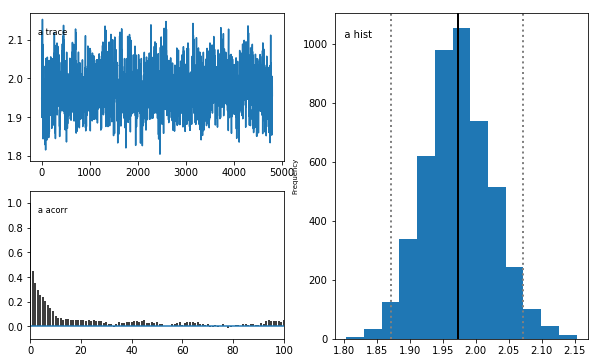

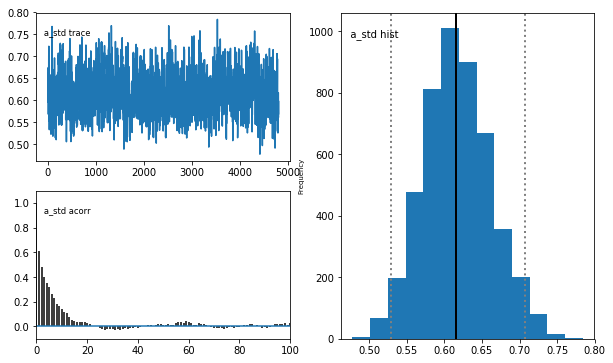

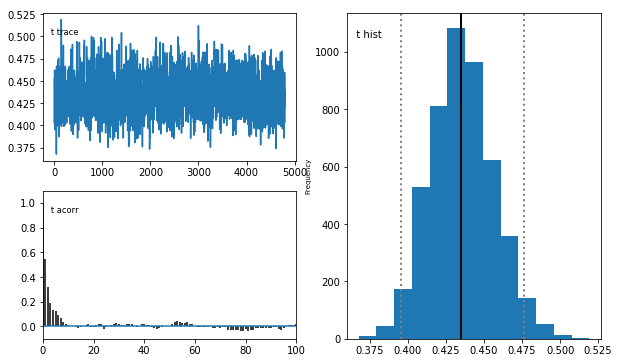

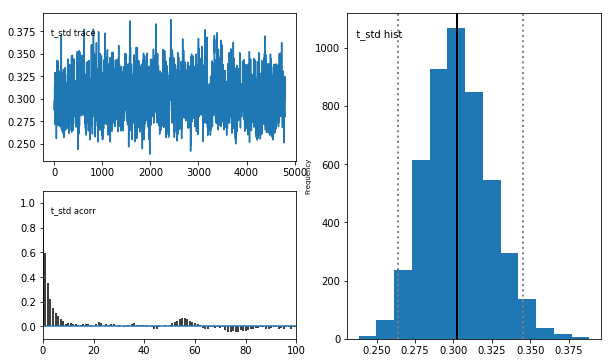

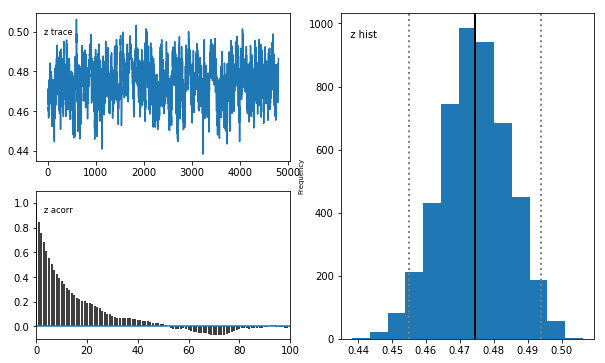

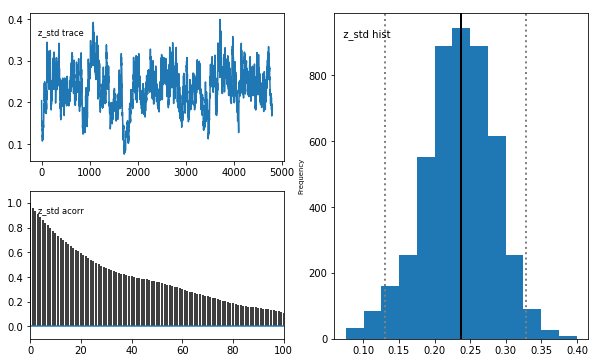

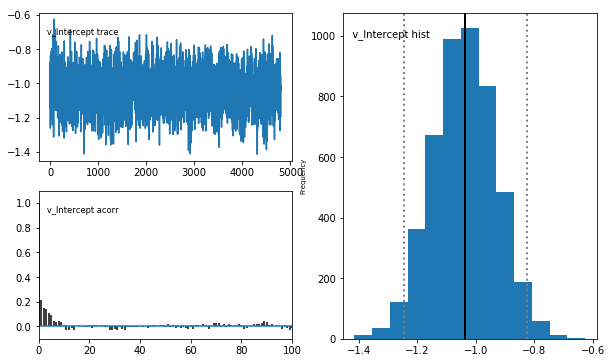

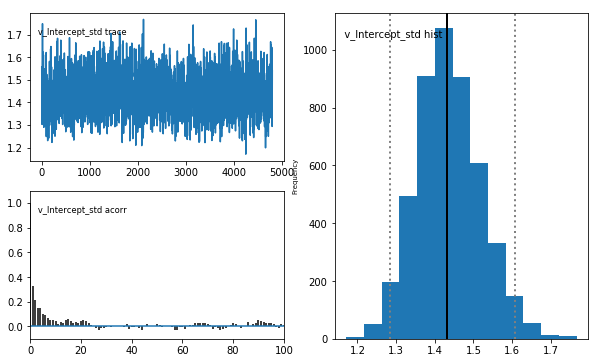

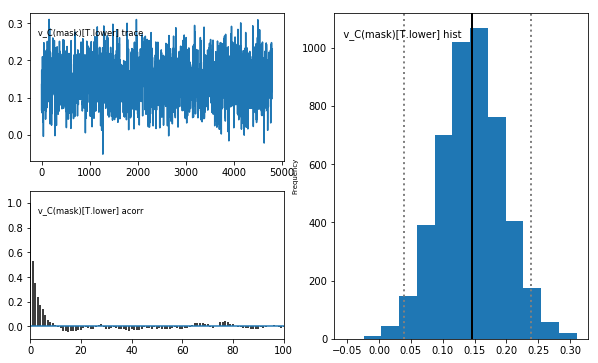

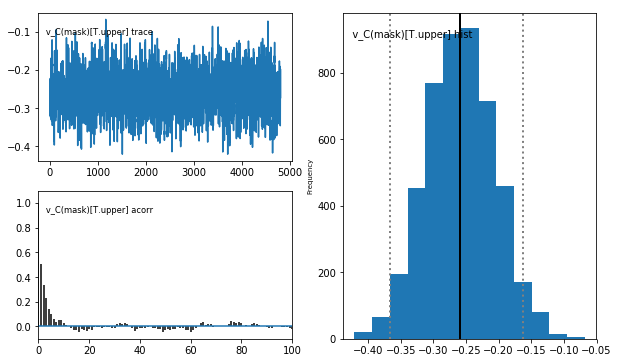

In [8]:
# run model
m_fa.sample(5000, burn=200, dbname='traces.db', db='pickle')
m_fa.print_stats()
m_fa.plot_posteriors()

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                       mean        std       2.5q       25q  \
a                                   1.97662  0.0758208    1.87827   1.94034   
a_std                              0.620747   0.096871   0.531555  0.586557   
a_subj.02hcv424u29nd5w              2.56693   0.438267    1.87013   2.25889   
a_subj.02k2uwlhgxnumn9              2.69653   0.328315    2.13369   2.46137   
a_subj.03g7h2hzq4o3g26              2.89664   0.364864    2.29017   2.63343   
a_subj.0nmr75cysk1ae0e              1.79485   0.353923    1.26647    1.5403   
a_subj.0t8qp67pqkw36cb              1.65433   0.220676    1.29074   1.49449   
a_subj.0vfpn4uf3t031qu               1.3495   0.257969   0.928007   1.16385   
a_subj.11dsfdtym1yy5mx              2.34544   0.489187    1.54681   1.98675   
a_subj.1d3dadyu4ekqb4q              1.52513   0.245533    1.12818   1.34403   
a_subj.1mt2emp4645cbl1              1.67897   0.234492    1.29274   1.51008   
a_subj.1rst24mbtgy9rc8              1.60537   0.2078

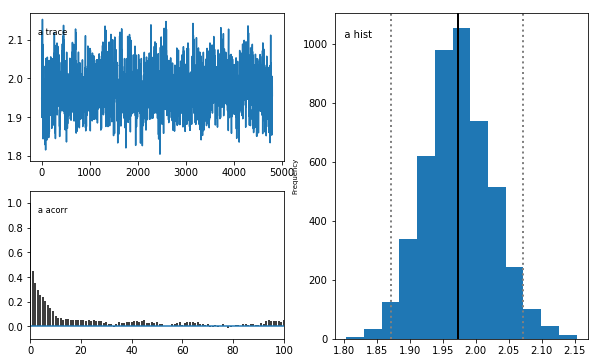

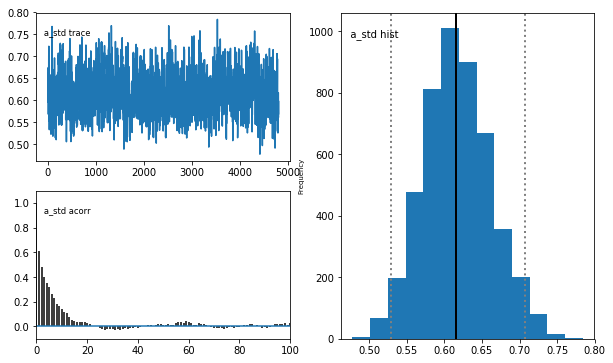

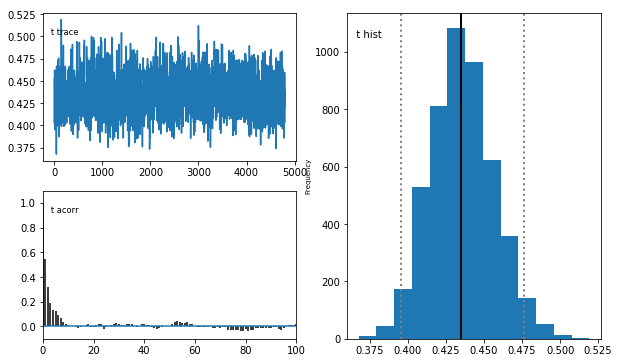

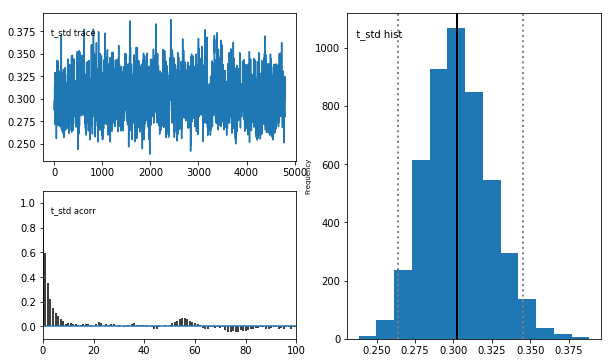

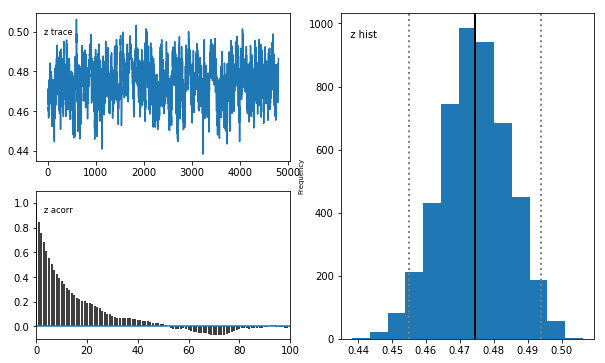

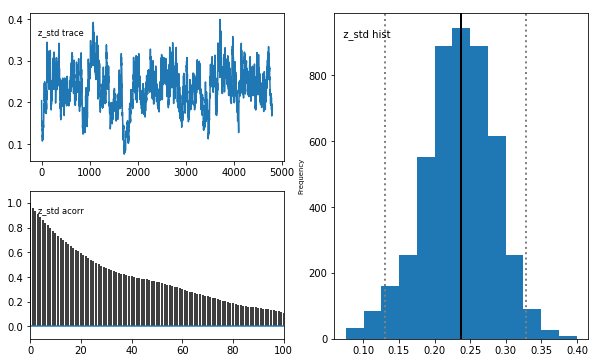

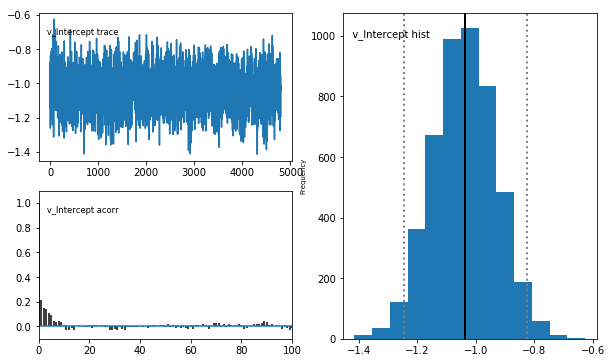

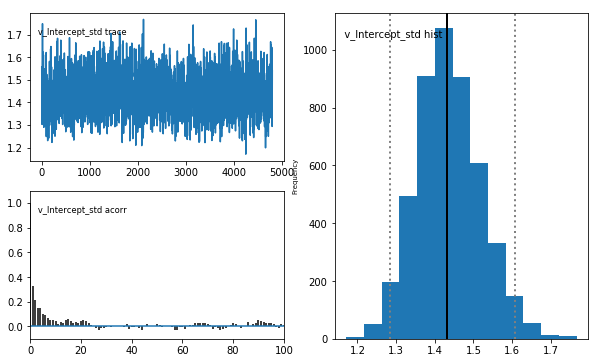

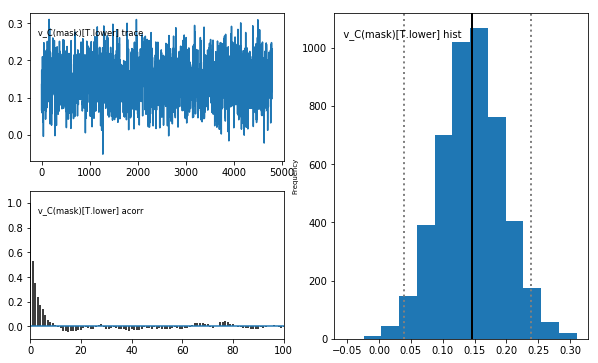

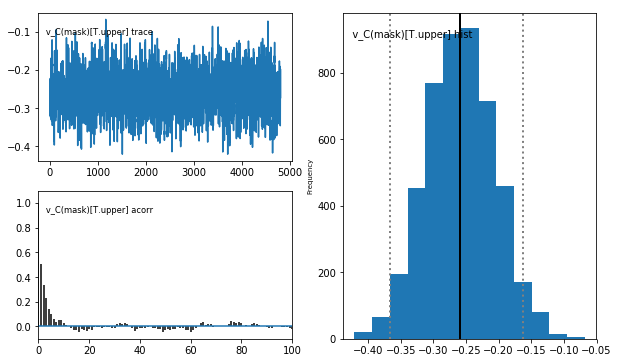

In [9]:
# save model stats
fa_stats = m_fa.gen_stats()
print(fa_stats)
fa_stats.to_csv('_maskFalsePositives/fa_5000/faceMask_hddm_drift_maskFalsePositives_fa_5000.csv', index=True)

# save model posterior plots
m_fa.plot_posteriors(path='_maskFalsePositives/fa_5000/_posteriors', save=True)

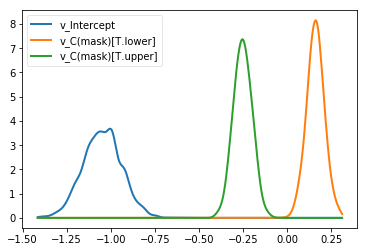

In [10]:
# plot model posteriors by mask
fa_v_none, fa_v_lower, fa_v_upper = m_fa.nodes_db.node[["v_Intercept", "v_C(mask)[T.lower]", "v_C(mask)[T.upper]"]]
hddm.analyze.plot_posterior_nodes([fa_v_none, fa_v_lower, fa_v_upper])
plt.savefig('_maskFalsePositives/fa_5000/faceMask_hddm_drift_maskFalsePositives_fa_5000_v_mask.pdf')

In [11]:
## estimate probabilities that mask coefficient posteriors differ from 0
# note that comparison condition coefficients (i.e. lower/upper) are *relative to* baseline condition (i.e. no mask)
# for lower/upper, =0 means no change from baseline, <0 means less than baseline, and >0 means greater than baseline
# for no mask, =0 means null drift, <0 means negative drift, and >0 means positive drift
print("P(fa_v_none > 0) = ", (fa_v_none.trace() > 0).mean())
print("P(fa_v_lower < 0) = ", (fa_v_lower.trace() < 0).mean())
print("P(fa_v_upper > 0) = ", (fa_v_upper.trace() > 0).mean())
# estimate probability that lower and upper mask coefficient posteriors differ
print("P(fa_v_lower < fa_v_upper) = ", (fa_v_lower.trace() < fa_v_upper.trace()).mean())

P(fa_v_none > 0) =  0.0
P(fa_v_lower < 0) =  0.00166666666667
P(fa_v_upper > 0) =  0.0
P(fa_v_lower < fa_v_upper) =  0.0


In [12]:
# subset dataset by emotion rating type (fearful) and facial expression (happy)
fh_data = data.loc[(data['emotionRating'] == 'fearful') & (data['expression'] == 'happy')]
fh_data.head(10)

,subj_idx,block,faceList,emotionRating,trial,stimulus,face,model,sex,expression,mask,response,rt,faceAngry,faceDisgusted,faceFearful,faceHappy,faceSad,faceSurprised
105,gc2le9xecjp1stz,1,4,fearful,108,_faces/16_F_H_U.jpg,16_F_H_U,16,F,happy,upper,0,-1.797400,0,0,0,50,0,0
108,gc2le9xecjp1stz,1,4,fearful,111,_faces/23_M_H_X.jpg,23_M_H_X,23,M,happy,baseline,0,-0.892460,0,0,0,100,0,0
110,gc2le9xecjp1stz,1,4,fearful,113,_faces/05_M_H_U.jpg,05_M_H_U,5,M,happy,upper,0,-0.748425,0,0,0,50,0,0
119,gc2le9xecjp1stz,1,4,fearful,122,_faces/01_F_H_L.jpg,01_F_H_L,1,F,happy,lower,0,-0.889530,0,0,0,50,0,0
126,gc2le9xecjp1stz,1,4,fearful,129,_faces/16_F_H_X.jpg,16_F_H_X,16,F,happy,baseline,0,-0.677850,0,0,0,100,0,0
129,gc2le9xecjp1stz,1,4,fearful,132,_faces/36_M_H_L.jpg,36_M_H_L,36,M,happy,lower,0,-0.956890,0,0,0,50,0,0
139,gc2le9xecjp1stz,1,4,fearful,142,_faces/01_F_H_X.jpg,01_F_H_X,1,F,happy,baseline,0,-0.774695,0,0,0,100,0,0
153,gc2le9xecjp1stz,1,4,fearful,156,_faces/36_M_H_U.jpg,36_M_H_U,36,M,happy,upper,0,-1.165355,0,0,0,50,0,0
158,gc2le9xecjp1stz,1,4,fearful,161,_faces/23_M_H_L.jpg,23_M_H_L,23,M,happy,lower,1,0.785650,0,0,0,50,0,0
161,gc2le9xecjp1stz,1,4,fearful,164,_faces/36_M_H_X.jpg,36_M_H_X,36,M,happy,baseline,1,0.856225,0,0,0,100,0,0


In [13]:
# drop any subjects missing columns in design matrix (otherwise produces error)
fh_data = fh_data[(fh_data.subj_idx != 'ygpcur698h4dcw5') & (fh_data.subj_idx != 'c6r924wdcxtkolt')]

In [14]:
# define model
m_fh = hddm.HDDMRegressor(fh_data, "v ~ C(mask)", bias=True, p_outlier=0.05)

Adding these covariates:
['v_Intercept', 'v_C(mask)[T.lower]', 'v_C(mask)[T.upper]']


 [-----------------100%-----------------] 5001 of 5000 complete in 52476.7 sec

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                       mean        std        2.5q        25q        50q        75q       97.5q       mc err
a                                   2.19652   0.485932      2.0461    2.12993    2.17578    2.22094      2.3153    0.0206417
a_std                              0.726658   0.815836    0.584534   0.650853   0.690668   0.732812    0.821368    0.0339933
a_subj.02hcv424u29nd5w              2.38617   0.309306     1.86938    2.16951    2.35608       2.57     3.08332    0.0079095
a_subj.02k2uwlhgxnumn9              2.04733   0.532216     1.24694    1.65806     1.9748    2.34818      3.3248    0.0250381
a_subj.03g7h2hzq4o3g26              2.85773   0.435995     2.13164    2.55369    2.81221    3.11427     3.86123    0.0123935
a_subj.0nmr75cysk1ae0e              3.18828   0.636501     2.44524    2.84896    3.12522    3.43471     4.19933    0.0238579
a_subj.0t8qp67pqkw36cb              2.29807   0.595854     1.36138    1.85529    2.21849    2.65029     3.66162    0.0274915


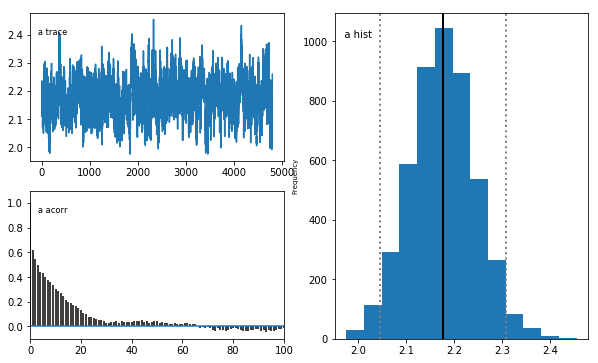

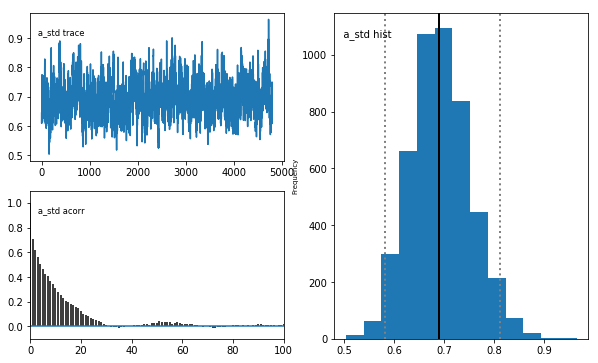

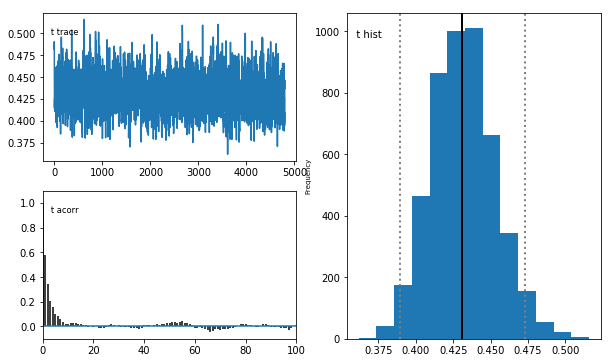

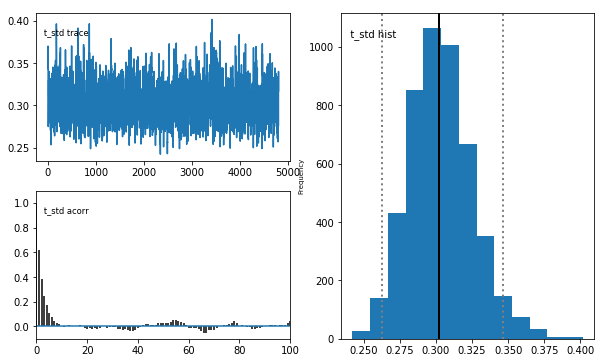

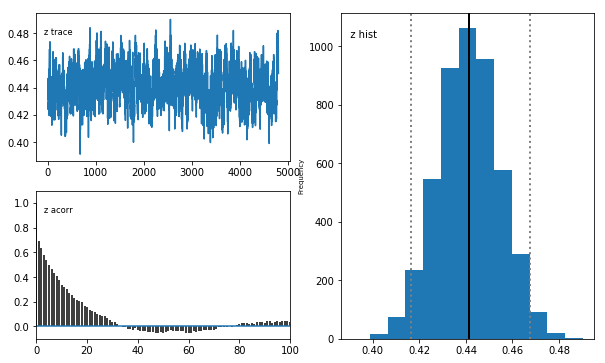

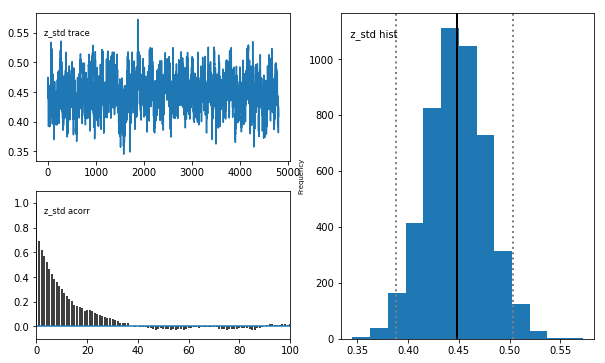

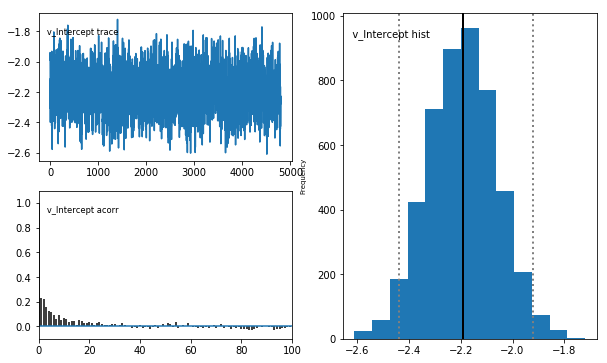

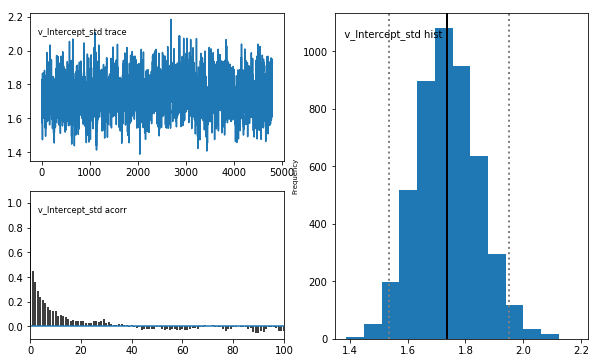

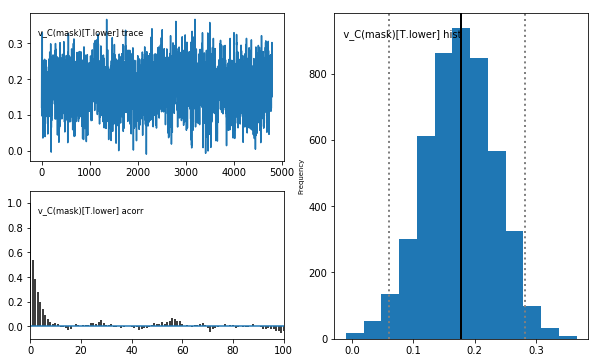

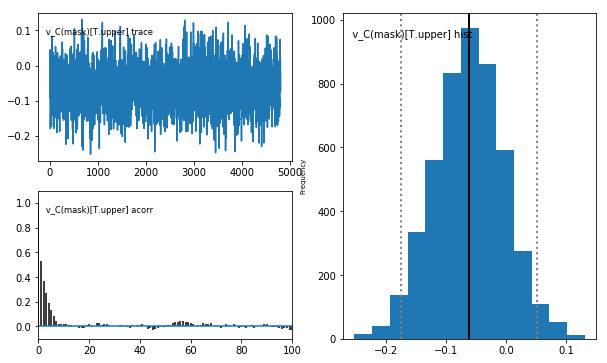

In [16]:
# run model
m_fh.sample(5000, burn=200, dbname='traces.db', db='pickle')
m_fh.print_stats()
m_fh.plot_posteriors()

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                       mean        std       2.5q       25q  \
a                                   2.19652   0.485932     2.0461   2.12993   
a_std                              0.726658   0.815836   0.584534  0.650853   
a_subj.02hcv424u29nd5w              2.38617   0.309306    1.86938   2.16951   
a_subj.02k2uwlhgxnumn9              2.04733   0.532216    1.24694   1.65806   
a_subj.03g7h2hzq4o3g26              2.85773   0.435995    2.13164   2.55369   
a_subj.0nmr75cysk1ae0e              3.18828   0.636501    2.44524   2.84896   
a_subj.0t8qp67pqkw36cb              2.29807   0.595854    1.36138   1.85529   
a_subj.0vfpn4uf3t031qu              2.23552   0.603063     1.2981   1.80127   
a_subj.11dsfdtym1yy5mx              2.79193   0.460258    2.04722   2.46795   
a_subj.1d3dadyu4ekqb4q              1.24828   0.170225    0.96317   1.12616   
a_subj.1mt2emp4645cbl1              2.65048    0.54803    1.83377   2.27187   
a_subj.1rst24mbtgy9rc8              2.03285   0.2633

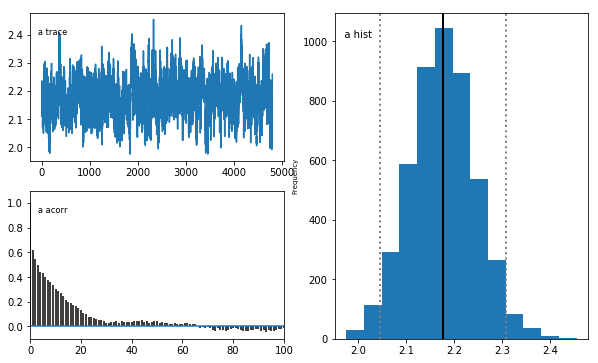

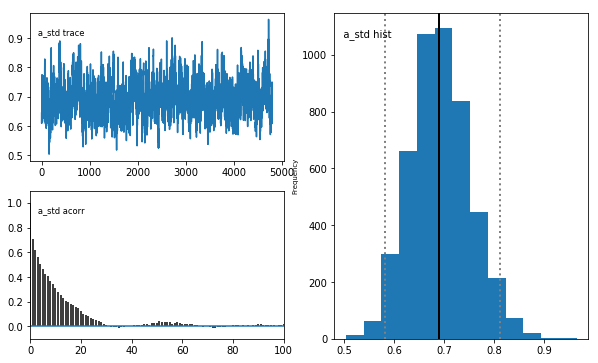

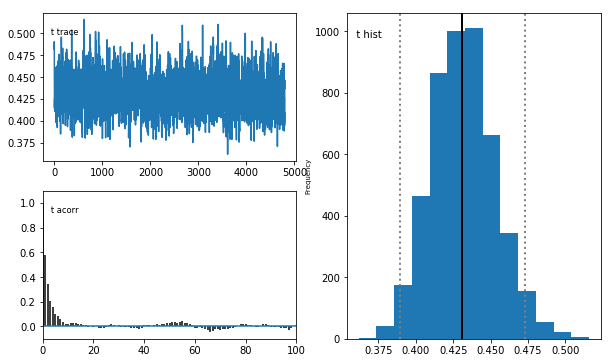

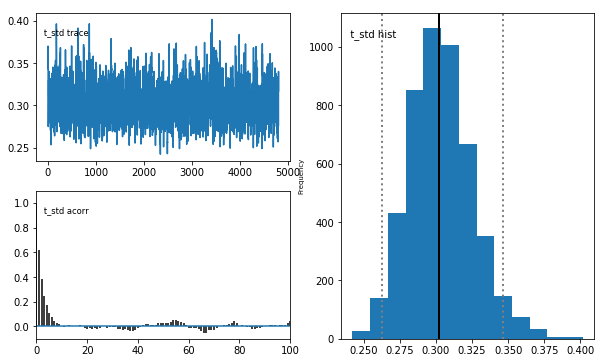

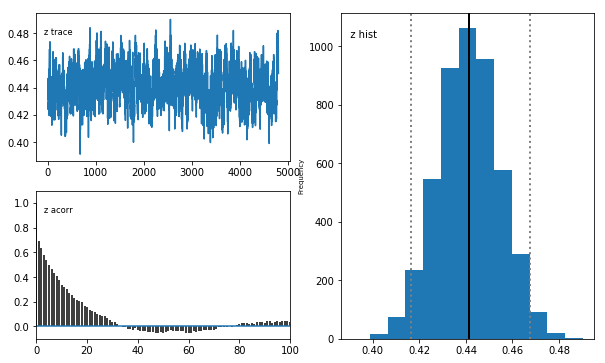

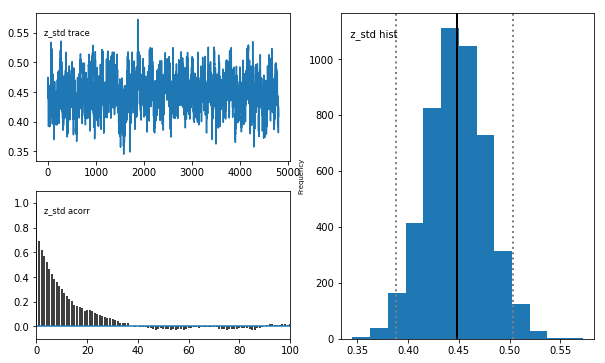

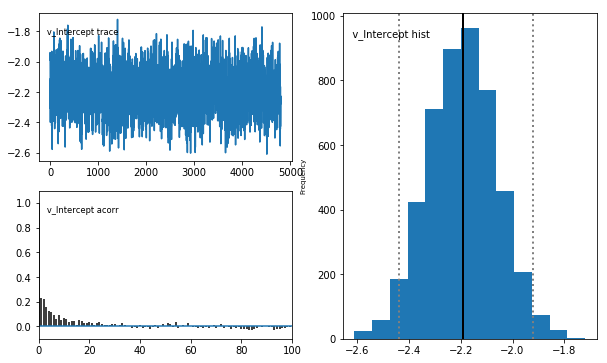

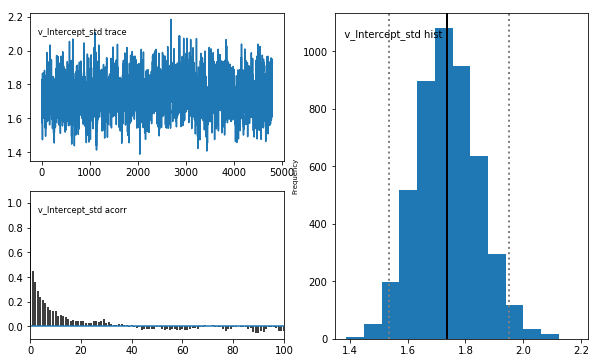

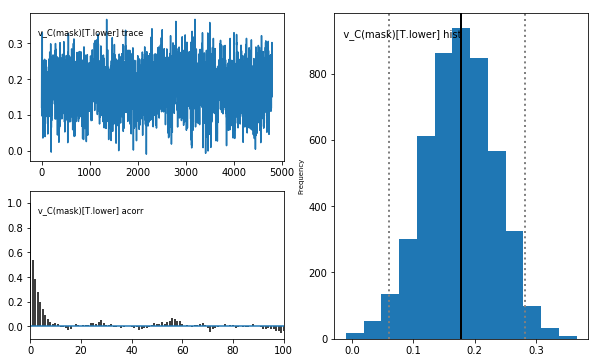

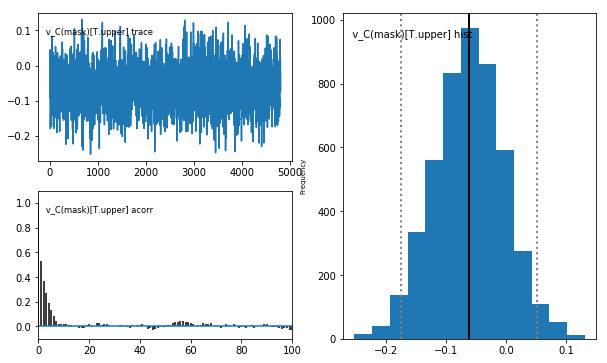

In [17]:
# save model stats
fh_stats = m_fh.gen_stats()
print(fh_stats)
fh_stats.to_csv('_maskFalsePositives/fh_5000/faceMask_hddm_drift_maskFalsePositives_fh_5000.csv', index=True)

# save model posterior plots
m_fh.plot_posteriors(path='_maskFalsePositives/fh_5000/_posteriors', save=True)

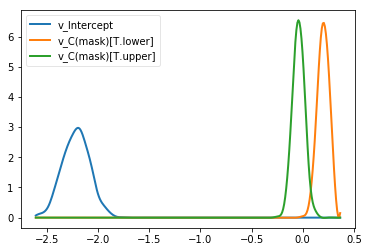

In [18]:
# plot model posteriors by mask
fh_v_none, fh_v_lower, fh_v_upper = m_fh.nodes_db.node[["v_Intercept", "v_C(mask)[T.lower]", "v_C(mask)[T.upper]"]]
hddm.analyze.plot_posterior_nodes([fh_v_none, fh_v_lower, fh_v_upper])
plt.savefig('_maskFalsePositives/fh_5000/faceMask_hddm_drift_maskFalsePositives_fh_5000_v_mask.pdf')

In [19]:
## estimate probabilities that mask coefficient posteriors differ from 0
# note that comparison condition coefficients (i.e. lower/upper) are *relative to* baseline condition (i.e. no mask)
# for lower/upper, =0 means no change from baseline, <0 means less than baseline, and >0 means greater than baseline
# for no mask, =0 means null drift, <0 means negative drift, and >0 means positive drift
print("P(fh_v_none > 0) = ", (fh_v_none.trace() > 0).mean()) 
print("P(fh_v_lower < 0) = ", (fh_v_lower.trace() < 0).mean())
print("P(fh_v_upper > 0) = ", (fh_v_upper.trace() > 0).mean())
# estimate probability that lower and upper mask coefficient posteriors differ
print("P(fh_v_lower < fh_v_upper) = ", (fh_v_lower.trace() < fh_v_upper.trace()).mean())

P(fh_v_none > 0) =  0.0
P(fh_v_lower < 0) =  0.00125
P(fh_v_upper > 0) =  0.143333333333
P(fh_v_lower < fh_v_upper) =  0.0


In [20]:
# subset dataset by emotion rating type (fearful) and facial expression (sad)
fs_data = data.loc[(data['emotionRating'] == 'fearful') & (data['expression'] == 'sad')]
fs_data.head(10)

,subj_idx,block,faceList,emotionRating,trial,stimulus,face,model,sex,expression,mask,response,rt,faceAngry,faceDisgusted,faceFearful,faceHappy,faceSad,faceSurprised
125,gc2le9xecjp1stz,1,4,fearful,128,_faces/22_F_S_U.jpg,22_F_S_U,22,F,sad,upper,0,-0.636280,0,0,0,0,50,0
131,gc2le9xecjp1stz,1,4,fearful,134,_faces/25_M_S_X.jpg,25_M_S_X,25,M,sad,baseline,0,-1.794275,0,0,0,0,100,0
137,gc2le9xecjp1stz,1,4,fearful,140,_faces/46_M_S_X.jpg,46_M_S_X,46,M,sad,baseline,1,1.091600,0,0,0,0,100,0
149,gc2le9xecjp1stz,1,4,fearful,152,_faces/04_F_S_L.jpg,04_F_S_L,4,F,sad,lower,0,-1.327530,0,0,0,0,50,0
150,gc2le9xecjp1stz,1,4,fearful,153,_faces/56_F_S_U.jpg,56_F_S_U,56,F,sad,upper,0,-2.043670,0,0,0,0,50,0
152,gc2le9xecjp1stz,1,4,fearful,155,_faces/04_F_S_U.jpg,04_F_S_U,4,F,sad,upper,1,1.023290,0,0,0,0,50,0
155,gc2le9xecjp1stz,1,4,fearful,158,_faces/22_F_S_L.jpg,22_F_S_L,22,F,sad,lower,0,-0.750755,0,0,0,0,50,0
164,gc2le9xecjp1stz,1,4,fearful,167,_faces/25_M_S_L.jpg,25_M_S_L,25,M,sad,lower,0,-0.746425,0,0,0,0,50,0
171,gc2le9xecjp1stz,1,4,fearful,174,_faces/46_M_S_U.jpg,46_M_S_U,46,M,sad,upper,0,-2.595005,0,0,0,0,50,0
176,gc2le9xecjp1stz,1,4,fearful,179,_faces/09_M_S_X.jpg,09_M_S_X,9,M,sad,baseline,0,-1.030560,0,0,0,0,100,0


In [21]:
# drop any subjects missing columns in design matrix (otherwise produces error)
# none in fs

In [22]:
# define model
m_fs = hddm.HDDMRegressor(fs_data, "v ~ C(mask)", bias=True, p_outlier=0.05)

Adding these covariates:
['v_Intercept', 'v_C(mask)[T.lower]', 'v_C(mask)[T.upper]']


 [-----------------100%-----------------] 5001 of 5000 complete in 41826.2 sec

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                       mean         std        2.5q         25q        50q        75q       97.5q       mc err
a                                   1.82093     0.53368     1.71565     1.76816    1.79754    1.82887     1.88853    0.0226022
a_std                              0.601391    0.995648      0.4933    0.534688   0.559843    0.58787    0.645423    0.0390693
a_subj.02hcv424u29nd5w              2.58838    0.447332     1.86711     2.27145    2.53846    2.85023     3.59672    0.0138691
a_subj.02k2uwlhgxnumn9              2.02413     0.23943      1.6149     1.85628    2.00064    2.16817     2.55158   0.00625236
a_subj.03g7h2hzq4o3g26              2.00555    0.238951     1.61186     1.83681    1.98196    2.14488     2.52276   0.00573779
a_subj.0nmr75cysk1ae0e              2.06467    0.364125     1.48905     1.80736    2.01501    2.27438     2.86018    0.0112542
a_subj.0t8qp67pqkw36cb              1.89344     0.22554     1.50798     1.73285    1.87518    2.02935     2.394

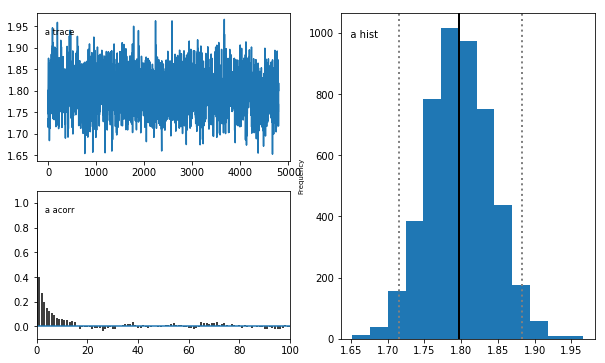

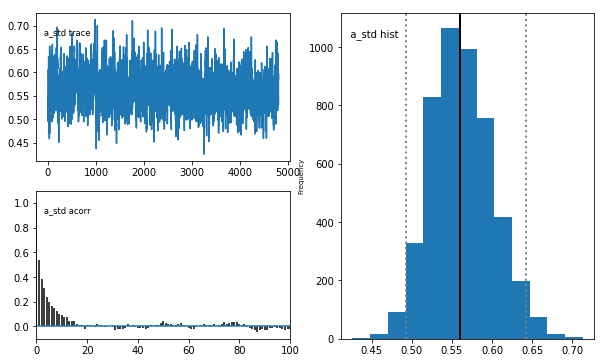

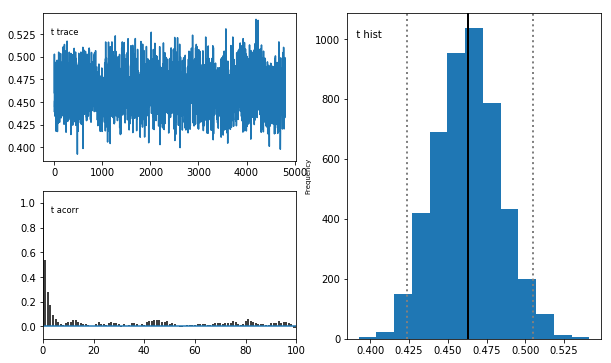

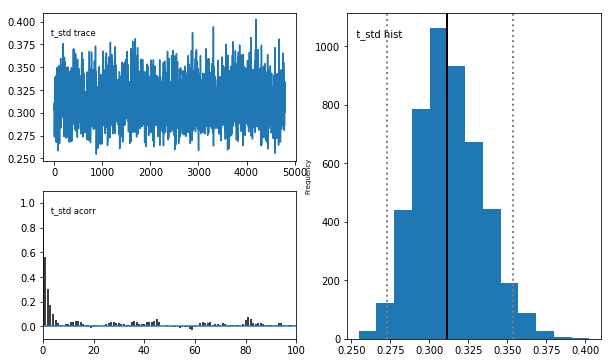

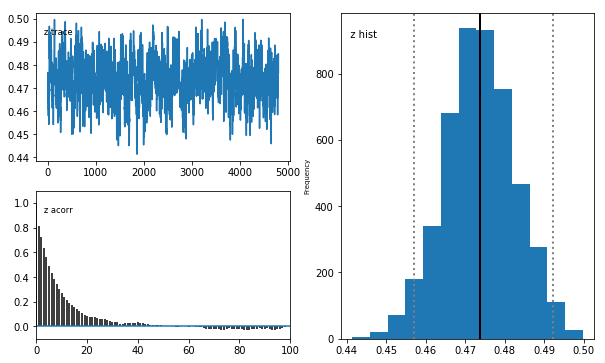

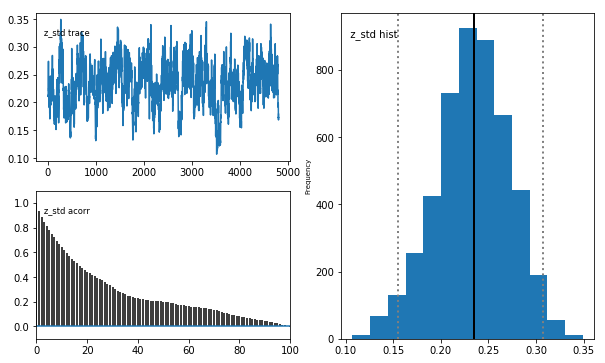

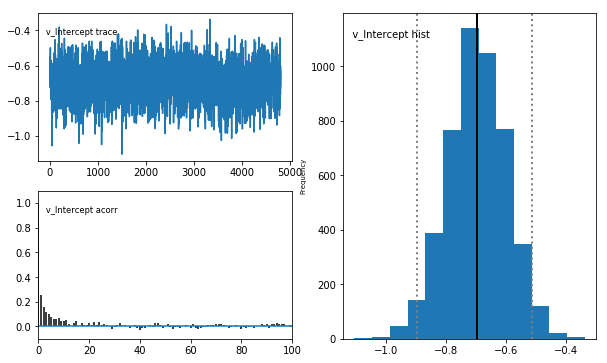

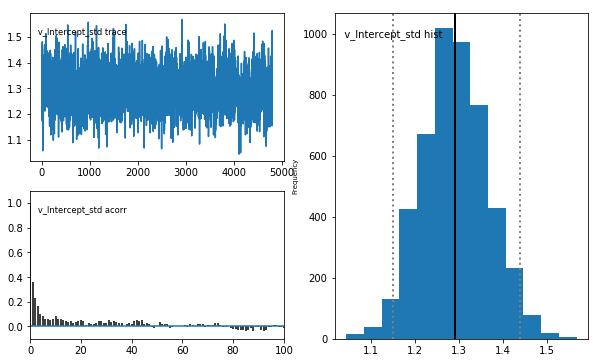

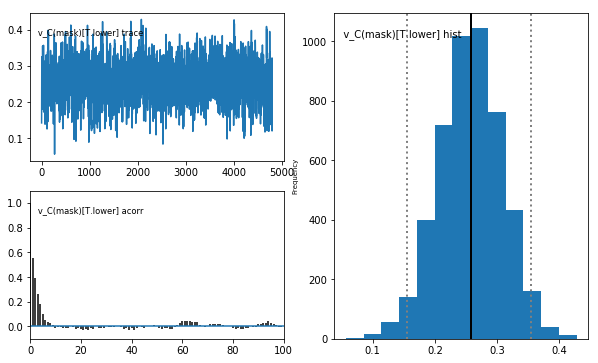

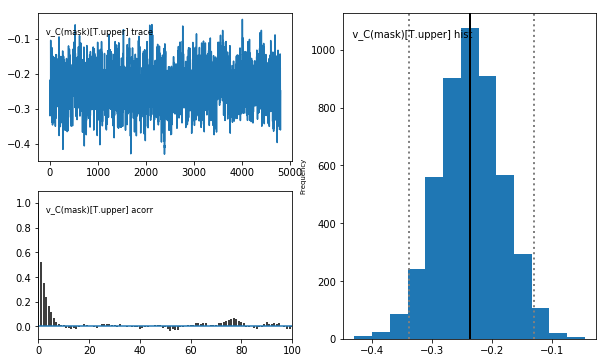

In [24]:
# run model
m_fs.sample(5000, burn=200, dbname='traces.db', db='pickle')
m_fs.print_stats()
m_fs.plot_posteriors()

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                       mean        std      2.5q        25q  \
a                                   1.82093    0.53368   1.71565    1.76816   
a_std                              0.601391   0.995648    0.4933   0.534688   
a_subj.02hcv424u29nd5w              2.58838   0.447332   1.86711    2.27145   
a_subj.02k2uwlhgxnumn9              2.02413    0.23943    1.6149    1.85628   
a_subj.03g7h2hzq4o3g26              2.00555   0.238951   1.61186    1.83681   
a_subj.0nmr75cysk1ae0e              2.06467   0.364125   1.48905    1.80736   
a_subj.0t8qp67pqkw36cb              1.89344    0.22554   1.50798    1.73285   
a_subj.0vfpn4uf3t031qu              1.38417   0.252754   1.00094    1.21135   
a_subj.11dsfdtym1yy5mx              2.28649   0.241327   1.85938    2.11502   
a_subj.1d3dadyu4ekqb4q              1.50184   0.219904   1.14338    1.34229   
a_subj.1mt2emp4645cbl1              1.97905   0.357576   1.46873    1.74909   
a_subj.1rst24mbtgy9rc8              1.28595   0.1783

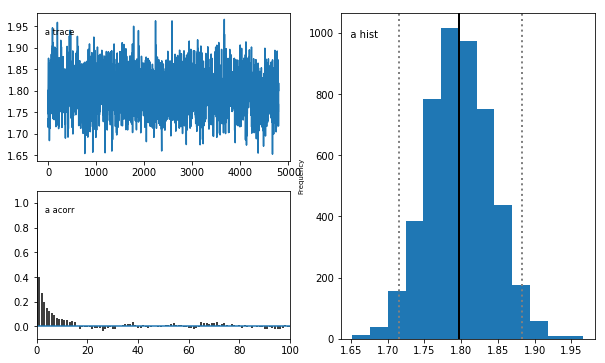

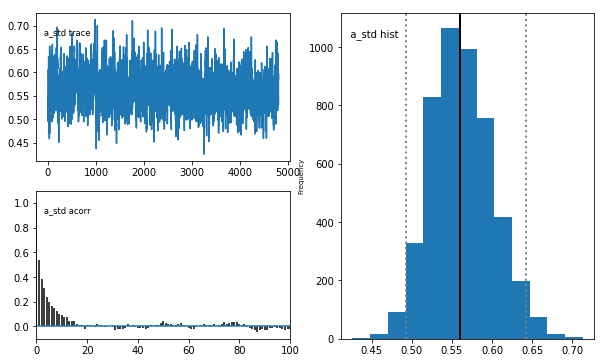

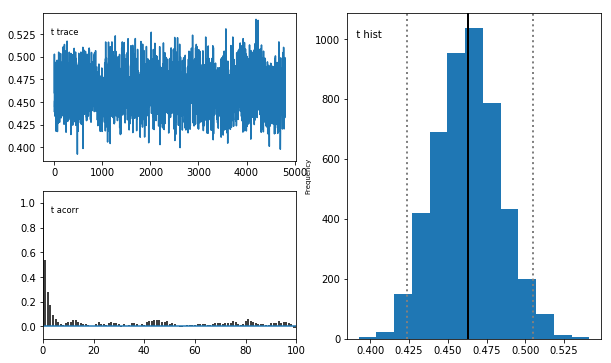

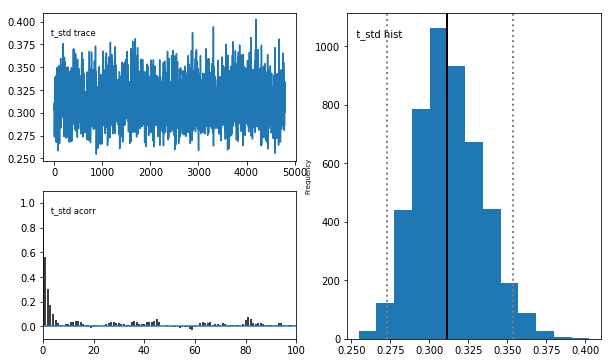

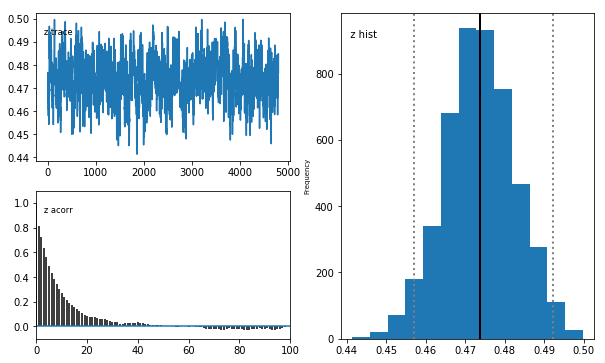

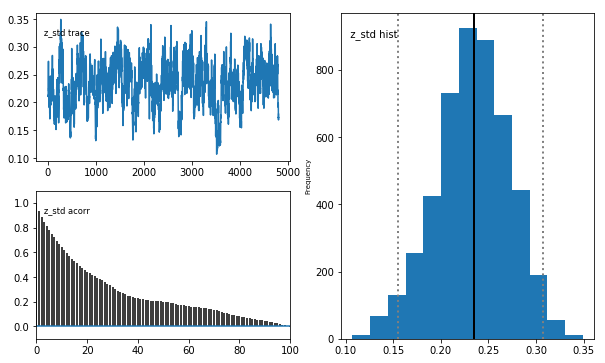

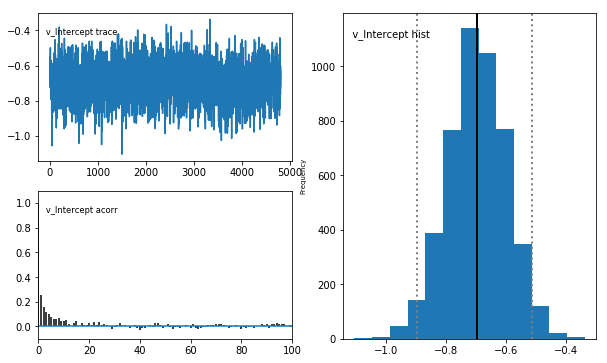

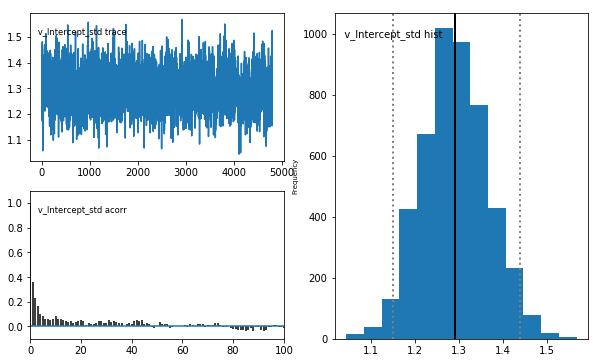

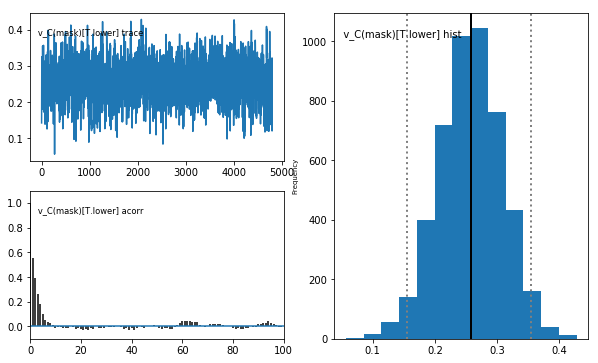

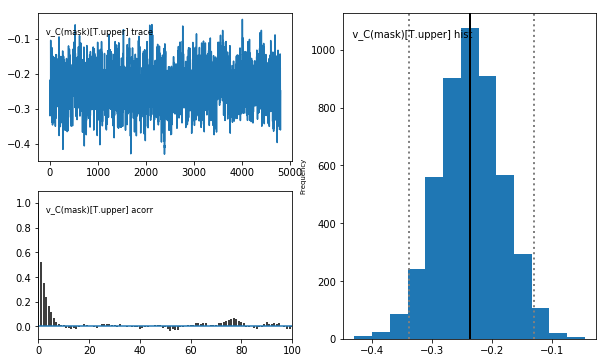

In [25]:
# save model stats
fs_stats = m_fs.gen_stats()
print(fs_stats)
fs_stats.to_csv('_maskFalsePositives/fs_5000/faceMask_hddm_drift_maskFalsePositives_fs_5000.csv', index=True)

# save model posterior plots
m_fs.plot_posteriors(path='_maskFalsePositives/fs_5000/_posteriors', save=True)

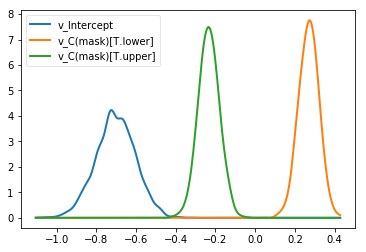

In [26]:
# plot model posteriors by mask
fs_v_none, fs_v_lower, fs_v_upper = m_fs.nodes_db.node[["v_Intercept", "v_C(mask)[T.lower]", "v_C(mask)[T.upper]"]]
hddm.analyze.plot_posterior_nodes([fs_v_none, fs_v_lower, fs_v_upper])
plt.savefig('_maskFalsePositives/fs_5000/faceMask_hddm_drift_maskFalsePositives_fs_5000_v_mask.pdf')

In [29]:
## estimate probabilities that mask coefficient posteriors differ from 0
# note that comparison condition coefficients (i.e. lower/upper) are *relative to* baseline condition (i.e. no mask)
# for lower/upper, =0 means no change from baseline, <0 means less than baseline, and >0 means greater than baseline
# for no mask, =0 means null drift, <0 means negative drift, and >0 means positive drift
print("P(fs_v_none > 0) = ", (fs_v_none.trace() > 0).mean()) 
print("P(fs_v_lower < 0) = ", (fs_v_lower.trace() < 0).mean())
print("P(fs_v_upper > 0) = ", (fs_v_upper.trace() > 0).mean())
# estimate probability that lower and upper mask coefficient posteriors differ
print("P(fs_v_lower < fs_v_upper) = ", (fs_v_lower.trace() < fs_v_upper.trace()).mean())

P(fs_v_none > 0) =  0.0
P(fs_v_lower < 0) =  0.0
P(fs_v_upper > 0) =  0.0
P(fs_v_lower < fs_v_upper) =  0.0


In [30]:
# subset dataset by emotion rating type (surprised) and facial expression (fearful)
fr_data = data.loc[(data['emotionRating'] == 'fearful') & (data['expression'] == 'surprised')]
fr_data.head(10)

,subj_idx,block,faceList,emotionRating,trial,stimulus,face,model,sex,expression,mask,response,rt,faceAngry,faceDisgusted,faceFearful,faceHappy,faceSad,faceSurprised
117,gc2le9xecjp1stz,1,4,fearful,120,_faces/38_M_R_X.jpg,38_M_R_X,38,M,surprised,baseline,0,-1.501205,0,0,0,0,0,100
122,gc2le9xecjp1stz,1,4,fearful,125,_faces/07_M_R_U.jpg,07_M_R_U,7,M,surprised,upper,0,-0.791350,0,0,0,0,0,50
128,gc2le9xecjp1stz,1,4,fearful,131,_faces/18_F_R_L.jpg,18_F_R_L,18,F,surprised,lower,0,-0.739495,0,0,0,0,0,50
133,gc2le9xecjp1stz,1,4,fearful,136,_faces/18_F_R_X.jpg,18_F_R_X,18,F,surprised,baseline,0,-1.197700,0,0,0,0,0,100
143,gc2le9xecjp1stz,1,4,fearful,146,_faces/02_F_R_L.jpg,02_F_R_L,2,F,surprised,lower,0,-0.730145,0,0,0,0,0,50
144,gc2le9xecjp1stz,1,4,fearful,147,_faces/18_F_R_U.jpg,18_F_R_U,18,F,surprised,upper,1,1.091375,0,0,0,0,0,50
154,gc2le9xecjp1stz,1,4,fearful,157,_faces/07_M_R_L.jpg,07_M_R_L,7,M,surprised,lower,0,-0.793940,0,0,0,0,0,50
156,gc2le9xecjp1stz,1,4,fearful,159,_faces/07_M_R_X.jpg,07_M_R_X,7,M,surprised,baseline,1,1.026535,0,0,0,0,0,100
168,gc2le9xecjp1stz,1,4,fearful,171,_faces/02_F_R_U.jpg,02_F_R_U,2,F,surprised,upper,0,-2.274875,0,0,0,0,0,50
169,gc2le9xecjp1stz,1,4,fearful,172,_faces/37_F_R_L.jpg,37_F_R_L,37,F,surprised,lower,0,-4.256955,0,0,0,0,0,50


In [31]:
# drop any subjects missing columns in design matrix (otherwise produces error)
fr_data = fr_data[(fr_data.subj_idx != 'ygpcur698h4dcw5')]

In [32]:
# define model
m_fr = hddm.HDDMRegressor(fr_data, "v ~ C(mask)", bias=True, p_outlier=0.05)

Adding these covariates:
['v_Intercept', 'v_C(mask)[T.lower]', 'v_C(mask)[T.upper]']


 [-----------------100%-----------------] 5001 of 5000 complete in 40803.0 sec

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                        mean         std         2.5q         25q         50q         75q      97.5q       mc err
a                                    1.77799    0.385596       1.6806     1.73284     1.75831     1.78552    1.83783    0.0190556
a_std                               0.549508    0.618351     0.456731    0.495006    0.517075    0.540399   0.592227     0.031058
a_subj.02hcv424u29nd5w               2.46984     0.39286      1.80903     2.19243     2.43409     2.69601     3.3339    0.0108471
a_subj.02k2uwlhgxnumn9               2.16221    0.223738      1.76954     2.00628     2.14732     2.30653    2.64103   0.00505125
a_subj.03g7h2hzq4o3g26               2.60928    0.332047      2.04322     2.38154     2.57937     2.81012    3.34875   0.00872846
a_subj.0nmr75cysk1ae0e               1.99582     0.29954      1.50224      1.7827     1.96253     2.16961    2.67921    0.0073441
a_subj.0t8qp67pqkw36cb               1.57915    0.179118      1.27048     1.44985     1.56

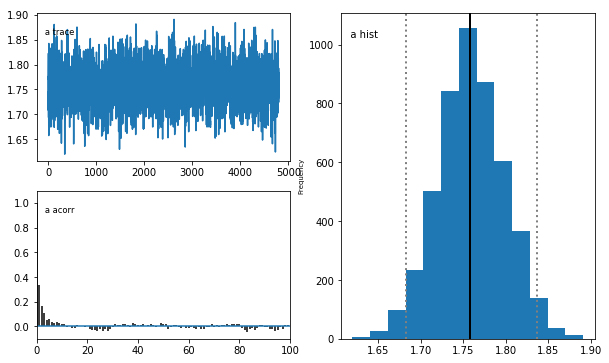

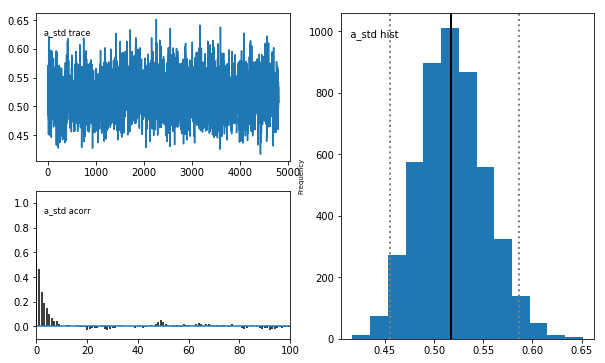

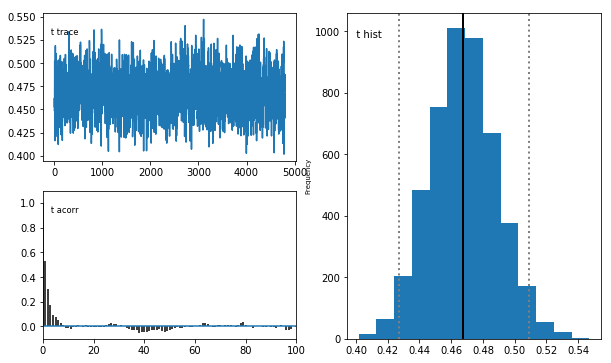

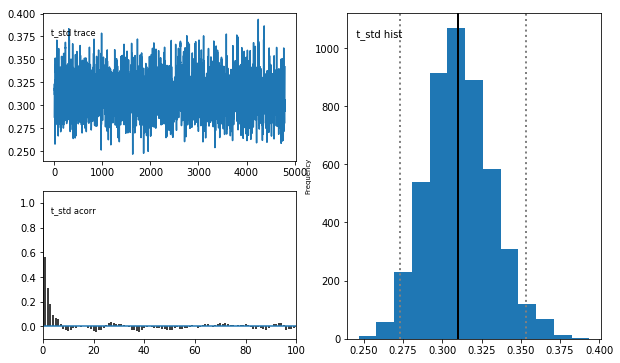

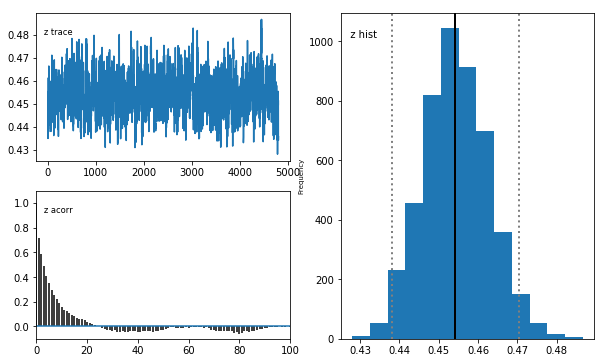

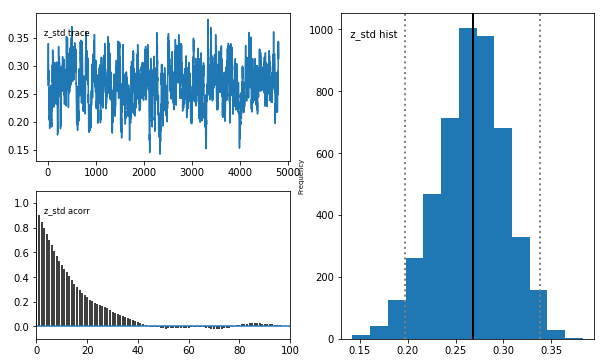

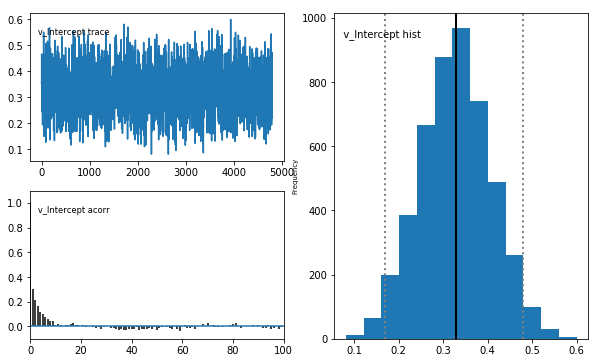

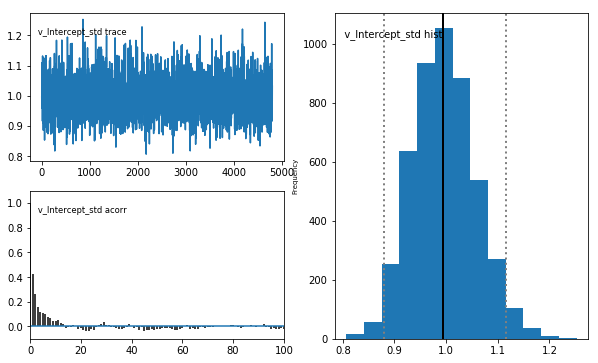

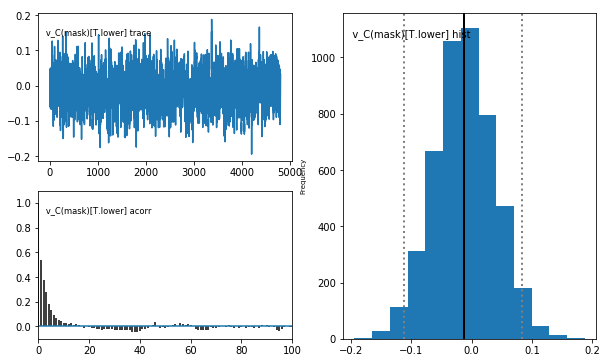

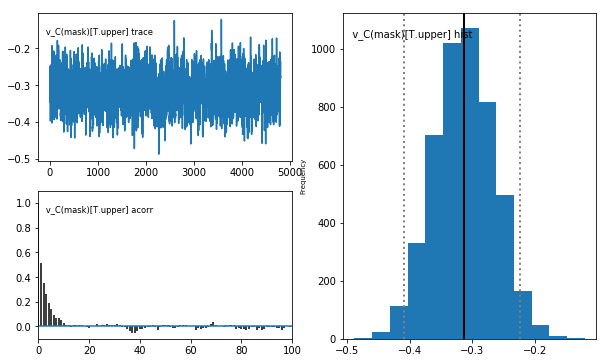

In [34]:
# run model
m_fr.sample(5000, burn=200, dbname='traces.db', db='pickle')
m_fr.print_stats()
m_fr.plot_posteriors()

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                       mean        std       2.5q        25q  \
a                                   1.77799   0.385596     1.6806    1.73284   
a_std                              0.549508   0.618351   0.456731   0.495006   
a_subj.02hcv424u29nd5w              2.46984    0.39286    1.80903    2.19243   
a_subj.02k2uwlhgxnumn9              2.16221   0.223738    1.76954    2.00628   
a_subj.03g7h2hzq4o3g26              2.60928   0.332047    2.04322    2.38154   
a_subj.0nmr75cysk1ae0e              1.99582    0.29954    1.50224     1.7827   
a_subj.0t8qp67pqkw36cb              1.57915   0.179118    1.27048    1.44985   
a_subj.0vfpn4uf3t031qu             0.980031   0.125524   0.765335   0.891035   
a_subj.11dsfdtym1yy5mx              2.08492   0.224337    1.69451    1.92477   
a_subj.1d3dadyu4ekqb4q               1.3466   0.167914    1.06014    1.22739   
a_subj.1mt2emp4645cbl1              2.19444   0.339975    1.63259    1.95311   
a_subj.1rst24mbtgy9rc8              1.57

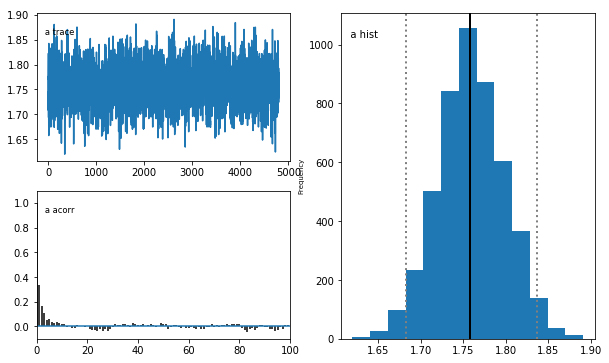

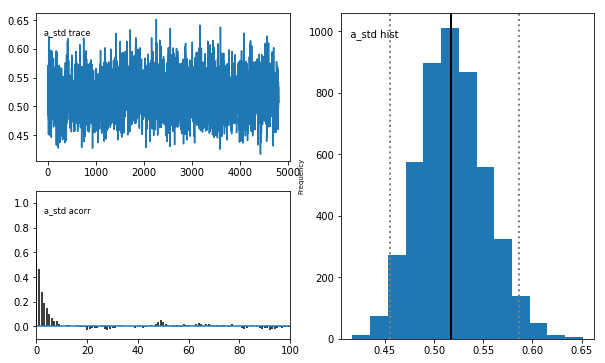

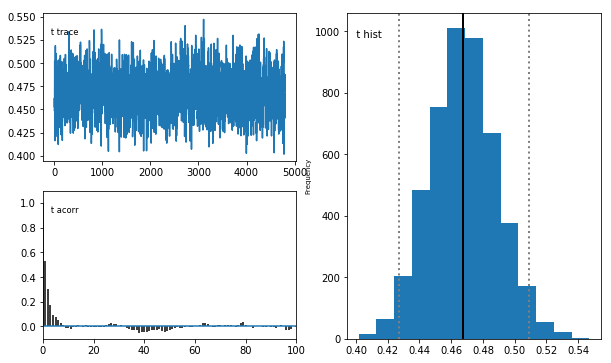

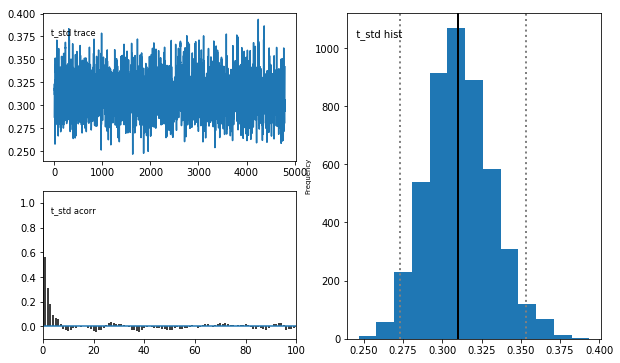

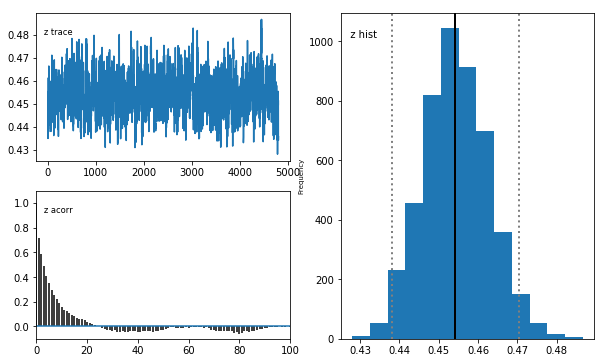

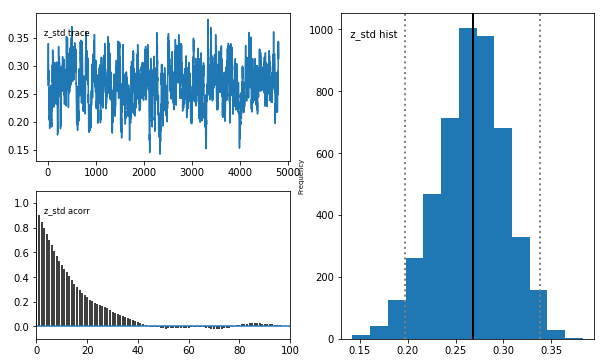

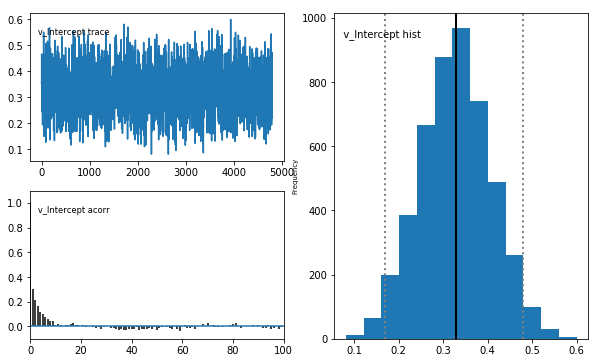

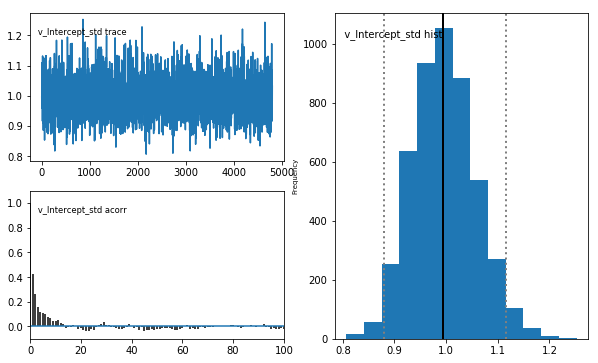

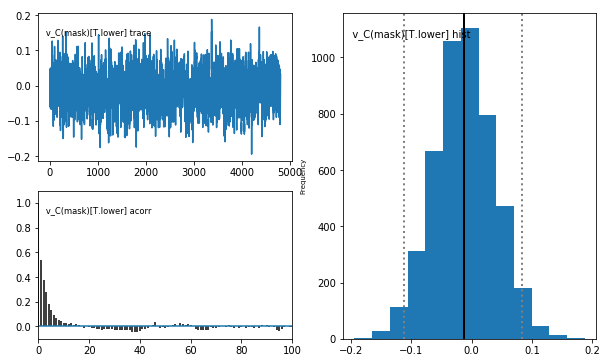

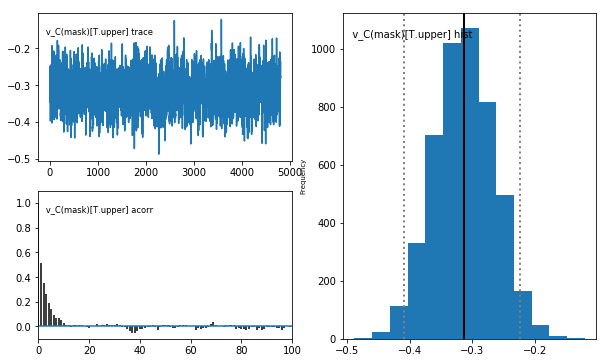

In [35]:
# save model stats
fr_stats = m_fr.gen_stats()
print(fr_stats)
fr_stats.to_csv('_maskFalsePositives/fr_5000/faceMask_hddm_drift_maskFalsePositives_fr_5000.csv', index=True)

# save model posterior plots
m_fr.plot_posteriors(path='_maskFalsePositives/fr_5000/_posteriors', save=True)

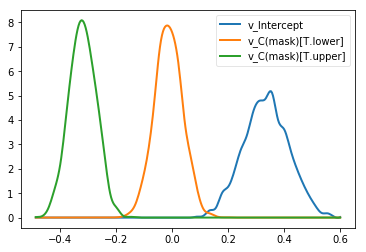

In [36]:
# plot model posteriors by mask
fr_v_none, fr_v_lower, fr_v_upper = m_fr.nodes_db.node[["v_Intercept", "v_C(mask)[T.lower]", "v_C(mask)[T.upper]"]]
hddm.analyze.plot_posterior_nodes([fr_v_none, fr_v_lower, fr_v_upper])
plt.savefig('_maskFalsePositives/fr_5000/faceMask_hddm_drift_maskFalsePositives_fr_5000_v_mask.pdf')

In [39]:
## estimate probabilities that mask coefficient posteriors differ from 0
# note that comparison condition coefficients (i.e. lower/upper) are *relative to* baseline condition (i.e. no mask)
# for lower/upper, =0 means no change from baseline, <0 means less than baseline, and >0 means greater than baseline
# for no mask, =0 means null drift, <0 means negative drift, and >0 means positive drift
print("P(fr_v_none < 0) = ", (fr_v_none.trace() < 0).mean()) 
print("P(fr_v_lower > 0) = ", (fr_v_lower.trace() > 0).mean())
print("P(fr_v_upper > 0) = ", (fr_v_upper.trace() > 0).mean())
# estimate probability that lower and upper mask coefficient posteriors differ
print("P(fr_v_lower < fr_v_upper) = ", (fr_v_lower.trace() < fr_v_upper.trace()).mean())

P(fr_v_none < 0) =  0.0
P(fr_v_lower > 0) =  0.397708333333
P(fr_v_upper > 0) =  0.0
P(fr_v_lower < fr_v_upper) =  0.0
